In [4]:
import pandas as pd
import sys
import os

pd.set_option('display.max_columns', 100)

In [5]:
print(sys.version)

3.9.18 (main, Sep 11 2023, 13:41:44) 
[GCC 11.2.0]


In [3]:
from cellphonedb.src.core.methods import cpdb_degs_analysis_method
# 参数设置
cpdb_file_path = "/home/data/sdzl14/NSCLC/zong/spatial/db/test/v5.0.0/cellphonedb.zip"  # 从官网下载的数据库
meta_file_path = "/home/data/sdzl14/NSCLC/zong/spatial/db/meta.tsv"
counts_file_path = "/home/data/sdzl14/NSCLC/zong/spatial/db/adata_spatial_counts.h5ad"
degs_file_path = "/home/data/sdzl14/NSCLC/zong/spatial/db/degs.txt"
output_path = "/home/data/sdzl14/NSCLC/zong/spatial/db/"
out_path = "/home/data/sdzl14/NSCLC/zong/spatial/db/"
microenvs_file_path = "/home/data/sdzl14/NSCLC/zong/spatial/db/microenvs.tsv"

cpdb_results = cpdb_degs_analysis_method.call(
    cpdb_file_path = cpdb_file_path,                            # mandatory: CellphoneDB database zip file.
    meta_file_path = meta_file_path,                            # mandatory: tsv file defining barcodes to cell label.
    counts_file_path = counts_file_path,                        # mandatory: normalized count matrix - a path to the counts file, or an in-memory AnnData object
    degs_file_path = degs_file_path,                            # mandatory: tsv file with DEG to account.
    counts_data = 'hgnc_symbol',                                # defines the gene annotation in counts matrix.
    microenvs_file_path = microenvs_file_path,                  # optional (default: None): defines cells per microenvironment.
    score_interactions = False,                                  # optional: whether to score interactions or not. 
    threshold = 0.1,                                            # defines the min % of cells expressing a gene for this to be employed in the analysis.
    result_precision = 3,                                       # Sets the rounding for the mean values in significan_means.
    separator = '|',                                            # Sets the string to employ to separate cells in the results dataframes "cellA|CellB".
    debug = False,                                              # Saves all intermediate tables emplyed during the analysis in pkl format.
    output_path = out_path,                                     # Path to save results
    output_suffix = None,                                       # Replaces the timestamp in the output files by a user defined string in the  (default: None)
    threads = 25
    )

[ ][CORE][22/04/25-14:35:45][INFO] [Cluster DEGs Analysis] Threshold:0.1 Precision:3
Reading user files...
The following user files were loaded successfully:
/home/data/sdzl14/NSCLC/zong/spatial/db/adata_spatial_counts.h5ad
/home/data/sdzl14/NSCLC/zong/spatial/db/meta.tsv
/home/data/sdzl14/NSCLC/zong/spatial/db/microenvs.tsv
/home/data/sdzl14/NSCLC/zong/spatial/db/degs.txt
[ ][CORE][22/04/25-14:35:57][INFO] Running Real Analysis
[ ][CORE][22/04/25-14:35:57][INFO] Limiting cluster combinations using microenvironments
[ ][CORE][22/04/25-14:35:57][INFO] Running DEGs-based Analysis
[ ][CORE][22/04/25-14:35:57][INFO] Building results
Saved deconvoluted to /home/data/sdzl14/NSCLC/zong/spatial/db/degs_analysis_deconvoluted_04_22_2025_143557.txt
Saved deconvoluted_percents to /home/data/sdzl14/NSCLC/zong/spatial/db/degs_analysis_deconvoluted_percents_04_22_2025_143557.txt
Saved means to /home/data/sdzl14/NSCLC/zong/spatial/db/degs_analysis_means_04_22_2025_143557.txt
Saved relevant_interaction

In [22]:
import scanpy as sc
adata = sc.read_h5ad(counts_file_path)
adata = adata.copy()

In [4]:

list(cpdb_results.keys())

['deconvoluted',
 'deconvoluted_percents',
 'means',
 'relevant_interactions',
 'significant_means',
 'CellSign_active_interactions',
 'CellSign_active_interactions_deconvoluted']

In [5]:
cpdb_results['relevant_interactions'].classification.value_counts()

classification
Signaling by WNT                                                   164
Adhesion by Collagen/Integrin                                      106
Signaling by WNT inhibition                                         50
Signaling by BMP                                                    33
Signaling by Chemokines                                             33
                                                                  ... 
Signaling by Neurexin                                                1
Adhesion by Thrombospondin                                           1
Signaling by Leucine-Rich Repeat Transmembrane Neuronal Protein      1
Signaling by Betacellulin                                            1
Signaling by Transferrin                                             1
Name: count, Length: 94, dtype: int64

In [7]:
microenv = pd.read_csv(microenvs_file_path,
                       sep = '\t')
microenv.head(3)

,cell_type,microenvironment
0,Cancer_P1_2_3,ST_1.1.1
1,B,ST_1.1.1
2,Ciliated cell,ST_1.1.1


In [8]:

microenv_dic = microenv.groupby('microenvironment')['cell_type'].apply(lambda x : list(x.value_counts().index))
microenv_dic


microenvironment
ST_1.1.1    [Cancer_P1_2_3, B, Ciliated cell, Club cell, N...
ST_1.2.1                           [Cancer_P1_2_3, Club cell]
ST_1.2.2                           [Cancer_P1_2_3, Club cell]
ST_1.3.1    [AT1, AT2, Endothelial cell, B, Macrophage, Fi...
ST_1.4.1    [Endothelial cell, Fibroblast, AT1, Club cell,...
ST_2.1.1                                      [Cancer_P1_2_3]
ST_2.2.1                                      [Cancer_P1_2_3]
ST_2.2.2                                      [Cancer_P1_2_3]
ST_3.1.1                                      [Cancer_P1_2_3]
ST_3.2.1                                      [Cancer_P1_2_3]
ST_3.2.2                                      [Cancer_P1_2_3]
ST_3.3.1    [AT1, Endothelial cell, Club cell, AT2, Macrop...
ST_5.2.1    [Cancer_P5, B, Macrophage, Fibroblast, Cancer_...
ST_5.2.2    [Macrophage, Cancer_P5, B, NK_T, Endothelial c...
ST_5.3.1    [Macrophage, AT1, NK_T, AT2, Endothelial cell,...
ST_6.2.1    [Cancer_P6, NK_T, B, Fibroblast, Endothel

In [20]:
from cellphonedb.utils import search_utils

search_results = search_utils.search_analysis_results(
    query_cell_types_1 = ['Cancer_P1_2_3'],  # List of cells 1, will be paired to cells 2 (list or 'All').
#    query_cell_types_2 = ['Cancer_P1_2_3'],     # List of cells 2, will be paired to cells 1 (list or 'All').
#    query_genes = ['WNT'],                                       # filter interactions based on the genes participating (list).
#     query_interactions = [''],                            # filter intereactions based on their name (list).
    significant_means = cpdb_results['significant_means'],          # significant_means file generated by CellphoneDB.
    deconvoluted = cpdb_results['deconvoluted'],                    # devonvoluted file generated by CellphoneDB.
    separator = '|',                                                # separator (default: |) employed to split cells (cellA|cellB).
    long_format = True,                                             # converts the output into a wide table, removing non-significant interactions
    query_classifications = ['Signaling by WNT']
)

search_results.head(10)

,interacting_pair,partner_a,partner_b,gene_a,gene_b,directionality,classification,interacting_cells,significant_mean
1,WNT2B_FZD10_LRP6,simple:Q93097,complex:FZD10_LRP6,WNT2B,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.152
4,WNT2B_FZD10_LRP5,simple:Q93097,complex:FZD10_LRP5,WNT2B,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.152
13,WNT2B_FZD3_LRP5,simple:Q93097,complex:FZD3_LRP5,WNT2B,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.140
16,WNT4_FZD10_LRP6,simple:P56705,complex:FZD10_LRP6,WNT4,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.286
18,WNT4_FZD10_LRP5,simple:P56705,complex:FZD10_LRP5,WNT4,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.286
19,WNT2B_FZD3_LRP6,simple:Q93097,complex:FZD3_LRP6,WNT2B,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.140
28,WNT5A_FZD10_LRP5,simple:P41221,complex:FZD10_LRP5,WNT5A,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.585
29,WNT5A_FZD10_LRP6,simple:P41221,complex:FZD10_LRP6,WNT5A,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.585
33,WNT2B_FZD2_LRP5,simple:Q93097,complex:FZD2_LRP5,WNT2B,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.152
34,WNT2B_FZD2_LRP6,simple:Q93097,complex:FZD2_LRP6,WNT2B,NaN,Ligand-Receptor,Signaling by WNT,Cancer_P1_2_3|Cancer_P1_2_3,0.152


In [13]:

import os
import anndata as ad
import pandas as pd
import ktplotspy as kpy
import matplotlib.pyplot as pl

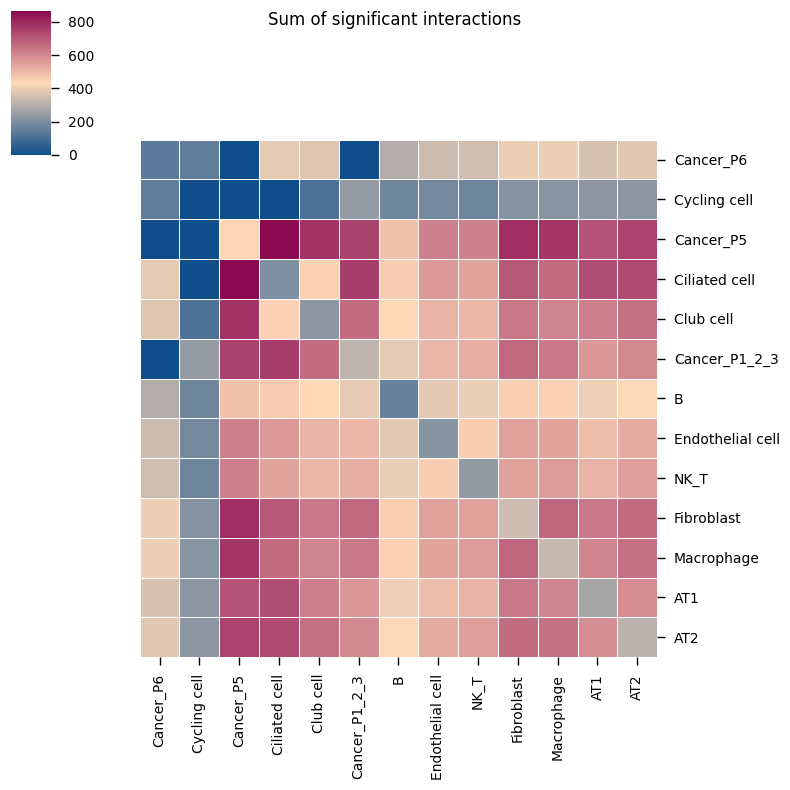

In [14]:

kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      figsize=(8, 8),
                      title="Sum of significant interactions")

In [15]:
microenv_dic

microenvironment
ST_1.1.1    [Cancer_P1_2_3, B, Ciliated cell, Club cell, N...
ST_1.2.1                           [Cancer_P1_2_3, Club cell]
ST_1.2.2                           [Cancer_P1_2_3, Club cell]
ST_1.3.1    [AT1, AT2, Endothelial cell, B, Macrophage, Fi...
ST_1.4.1    [Endothelial cell, Fibroblast, AT1, Club cell,...
ST_2.1.1                                      [Cancer_P1_2_3]
ST_2.2.1                                      [Cancer_P1_2_3]
ST_2.2.2                                      [Cancer_P1_2_3]
ST_3.1.1                                      [Cancer_P1_2_3]
ST_3.2.1                                      [Cancer_P1_2_3]
ST_3.2.2                                      [Cancer_P1_2_3]
ST_3.3.1    [AT1, Endothelial cell, Club cell, AT2, Macrop...
ST_5.2.1    [Cancer_P5, B, Macrophage, Fibroblast, Cancer_...
ST_5.2.2    [Macrophage, Cancer_P5, B, NK_T, Endothelial c...
ST_5.3.1    [Macrophage, AT1, NK_T, AT2, Endothelial cell,...
ST_6.2.1    [Cancer_P6, NK_T, B, Fibroblast, Endothel

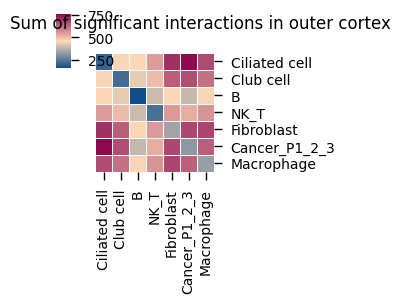

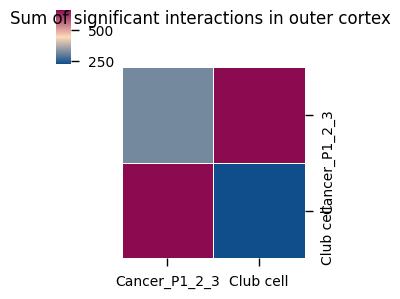

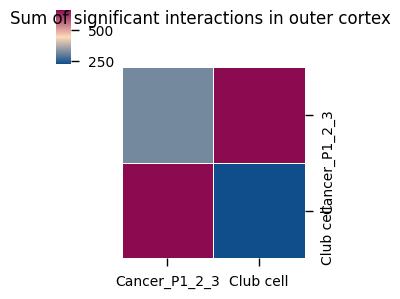

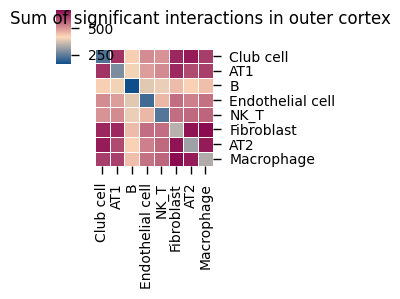

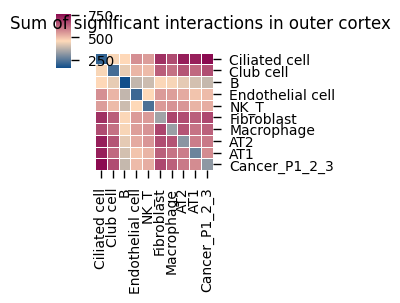

...

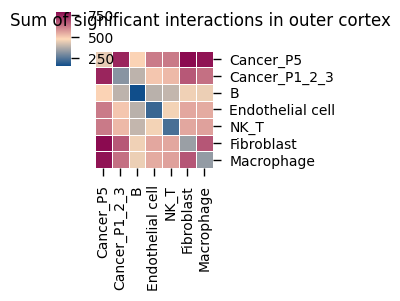

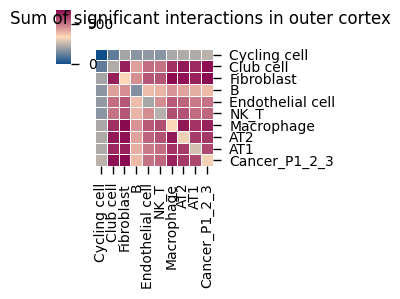

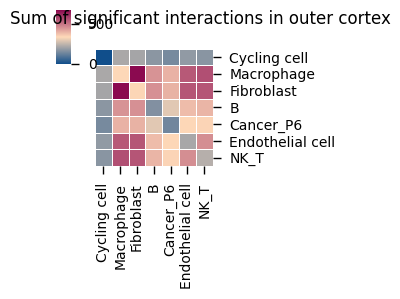

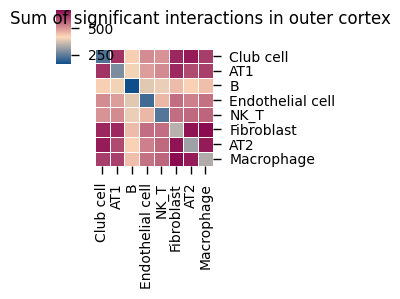

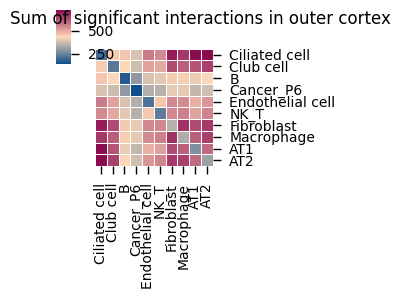

In [16]:
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_1.1.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")

kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_1.2.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_1.2.2'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_1.3.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")

kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_1.4.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")

kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_3.3.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_5.2.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_5.2.2'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_5.3.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_6.2.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_6.3.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")
kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      cell_types=microenv_dic['ST_6.4.1'],
                      figsize=(3, 3),
                      title="Sum of significant interactions in outer cortex")

In [39]:
microenv_dic['ST_1.1.1']

['Cancer_P1_2_3',
 'B',
 'Ciliated cell',
 'Club cell',
 'NK_T',
 'Macrophage',
 'Fibroblast']

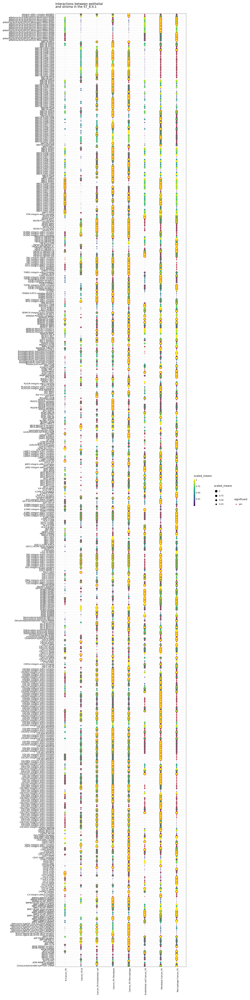

<Figure Size: (1500 x 6000)>

In [31]:
kpy.plot_cpdb(
    adata = adata,
    cell_type1 = "Cancer_P5",
    cell_type2 = "B|Macrophage|Fibroblast|Endothelial cell|NK_T",
    means = cpdb_results['means'],
    pvals = cpdb_results['relevant_interactions'],
    celltype_key = "spatial_celltype_fine",
#     genes = ["JAG1"],
    figsize = (15,60),
    title = "Interactions between epithelial \nand stroma in the ST_6.4.1",
    max_size = 5,
    highlight_size = 0.75,
    degs_analysis = True,
    standard_scale = True,
#     interaction_scores = cpdb_results['interaction_scores'],
    scale_alpha_by_interaction_scores=True,
)

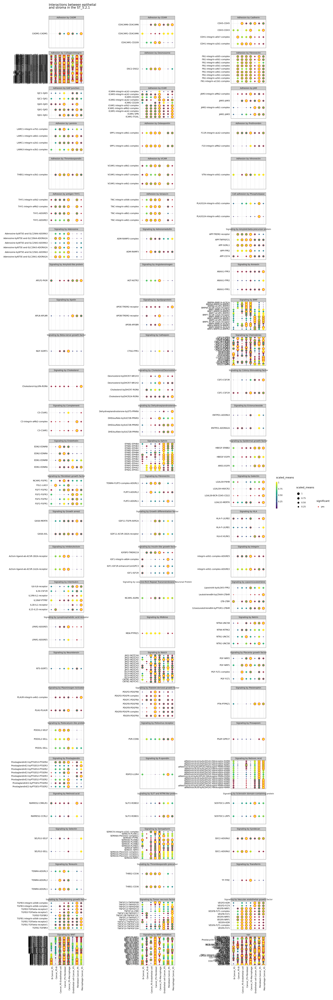

<Figure Size: (2000 x 6000)>

In [35]:
from plotnine import facet_wrap

p = kpy.plot_cpdb(
    adata = adata,
    cell_type1 = "Cancer_P5",
    cell_type2 = "B|Macrophage|Fibroblast|Endothelial cell|NK_T",
    means = cpdb_results['means'],
    pvals = cpdb_results['relevant_interactions'],
    celltype_key = "spatial_celltype_fine",
#     genes = ["JAG1"],
    figsize = (20,60),
    title = "Interactions between epithelial \nand stroma in the ST_5.2.1",
    max_size = 5,
    highlight_size = 0.75,
    degs_analysis = True,
    standard_scale = True,
#     interaction_scores = cpdb_results['interaction_scores'],
    scale_alpha_by_interaction_scores=True,
)

p + facet_wrap("~ classification", ncol = 3, scales='free_y')

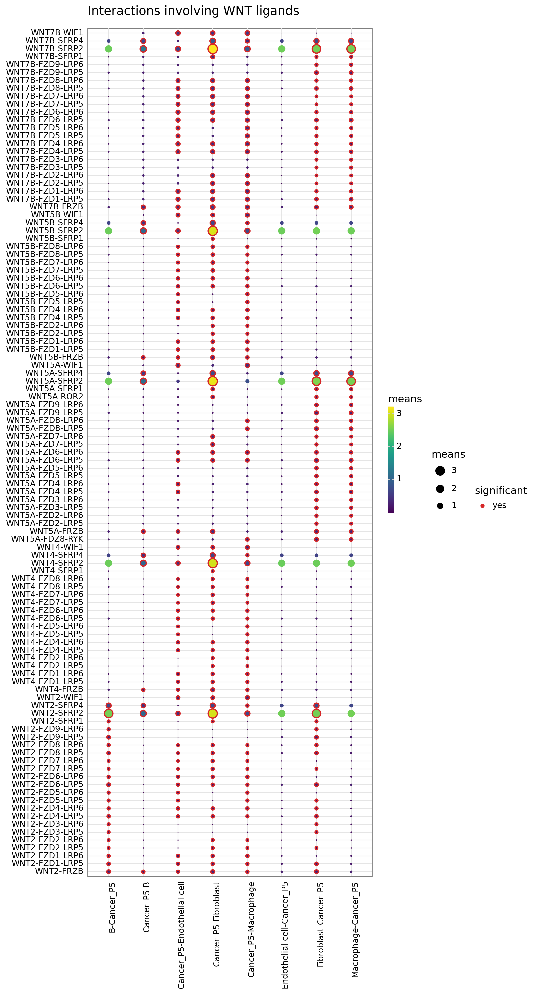

<Figure Size: (800 x 1500)>

In [37]:
kpy.plot_cpdb(
    adata = adata,
    cell_type1 = "Cancer_P5",
    cell_type2 = "B|Macrophage|Fibroblast|Endothelial cell|NK_T",
    means = cpdb_results['means'],
    pvals = cpdb_results['relevant_interactions'],
    celltype_key = "spatial_celltype_fine",
    genes = ["WNT2", "WNT4", "WNT5A","WNT5B","WNT7B"],
    figsize = (8,15),
    title = "Interactions involving WNT ligands",
    max_size = 5,
    highlight_size = 0.75,
    degs_analysis = True,
    standard_scale = False
)

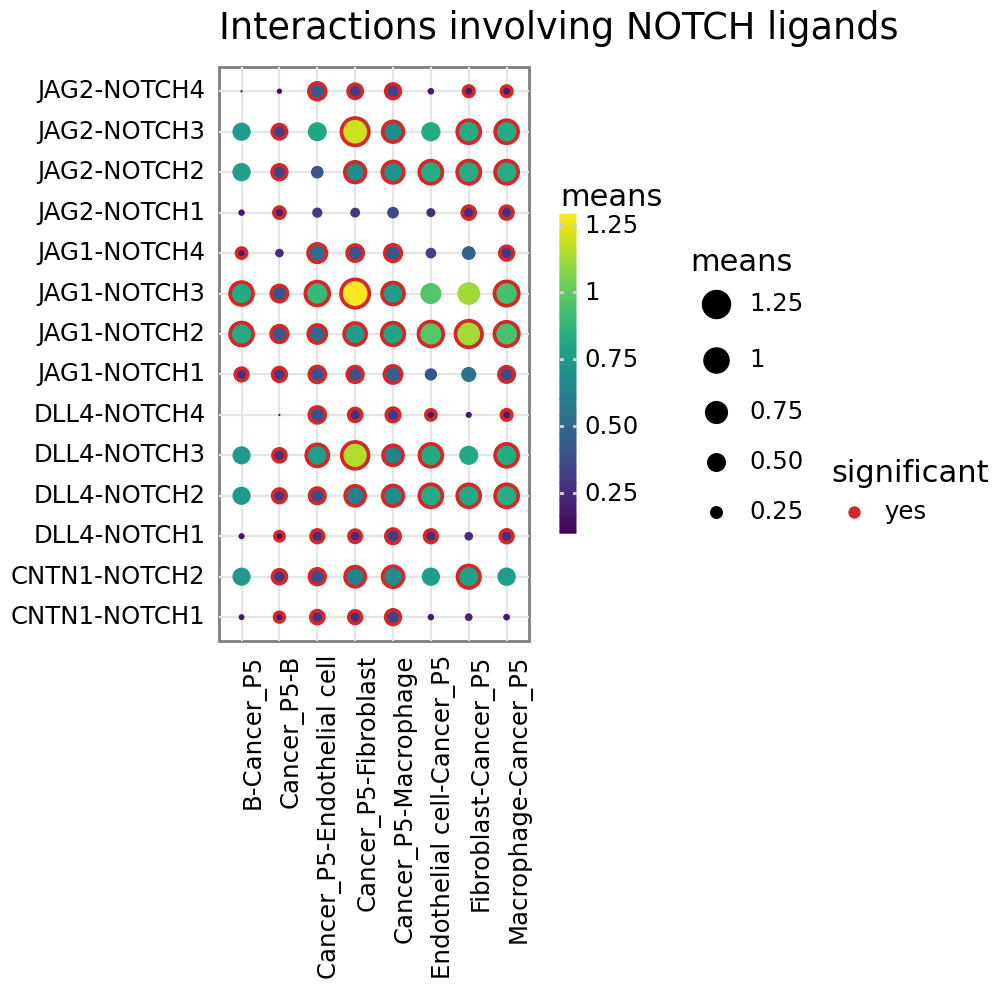

<Figure Size: (500 x 500)>

In [38]:
kpy.plot_cpdb(
    adata = adata,
    cell_type1 = "Cancer_P5",
    cell_type2 = "B|Macrophage|Fibroblast|Endothelial cell|NK_T",
    means = cpdb_results['means'],
    pvals = cpdb_results['relevant_interactions'],
    celltype_key = "spatial_celltype_fine",
    genes = ["NOTCH1", "NOTCH2", "NOTCH3","NOTCH4"],
    figsize = (5,5),
    title = "Interactions involving NOTCH ligands",
    max_size = 5,
    highlight_size = 0.75,
    degs_analysis = True,
    standard_scale = False
)

In [40]:
microenv_dic['ST_1.1.1']

['Cancer_P1_2_3',
 'B',
 'Ciliated cell',
 'Club cell',
 'NK_T',
 'Macrophage',
 'Fibroblast']

In [ ]:
adata = sc.read_h5ad('/home/data/sdzl14/NSCLC/zong/third.scANVI_adata.h5ad')
adata

AnnData object with n_obs × n_vars = 1042961 × 16813
    obs: 'Sample', 'Patient', 'Celltype', 'Dataset', 'Platform', 'Pathtype', 'Drug', 'Timepoint', 'Tissue', 'Origin', 'Celltype_fine', 'batch', 'C_scANVI', '_prediction', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'C_scANVI_colors', 'Celltype_colors', 'Dataset_colors', 'Drug_colors', 'Origin_colors', 'Platform_colors', 'Timepoint_colors', 'Tissue_colors', '_prediction_colors', 'batch_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_scanvi_fix', 'X_scanvi_fix_linear', 'X_scanvi_no_fix', 'X_scvi', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [51]:
adata.obs['_prediction'].cat.categories

Index(['CD4+T', 'CD8+T', 'Cycling cell', 'DC', 'Endothelium', 'Fibroblast',
       'GC B cell', 'ILC', 'Macrophage', 'Malignant', 'Mast', 'Memory B cell',
       'Monocyte', 'NK', 'Naive B cell', 'Neutrophil', 'Normal_Epi', 'Plasma',
       'Treg', 'pDC'],
      dtype='object')

In [6]:
import scanpy as sc
epi = sc.read_h5ad("/home/data/sdzl14/NSCLC/zong/epi.h5ad")
epi =epi.copy()

AnnData object with n_obs × n_vars = 255543 × 17317
    obs: 'Sample', 'Patient', 'Celltype', 'Dataset', 'Platform', 'Pathtype', 'Drug', 'Timepoint', 'Tissue', 'Origin', 'tumor_nontumor_finer', 'minor', 'cell_type', 'celltype_fine', 'Epithelium_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'Dataset_colors', 'Pathtype_colors', 'hvg', 'log1p'
    obsm: 'X_scanvi_fix', 'X_scanvi_fix_linear', 'X_scanvi_no_fix', 'X_scvi', 'X_umap', '_latent'
    layers: 'counts'

In [8]:
epi.obs['Tissue'].cat.categories

Index(['effusion', 'normal_adjacent', 'tumor_edge', 'tumor_metastasis',
       'tumor_middle', 'tumor_primary'],
      dtype='object')

/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


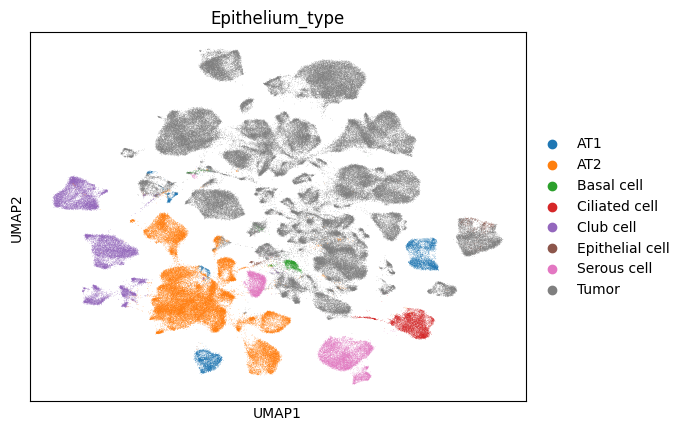

In [9]:
sc.pp.neighbors(epi, use_rep='X_scanvi_fix_linear',n_neighbors=35)
sc.tl.umap(epi,min_dist=0.5)
sc.pl.umap(epi,color=['Epithelium_type'])


In [11]:

epi.write_h5ad("/home/data/sdzl14/NSCLC/zong/epi.h5ad")
epi =epi.copy()

In [10]:
# 检查原始类别
print("Original categories in 'Tissue':", epi.obs['Tissue'].cat.categories)

# 创建一个新的分类列，仅针对'tumor_metastasis'
def create_subcategory(row):
    if row['Tissue'] == 'tumor_metastasis':
        return f"{row['Tissue']}_{row['Origin']}"
    else:
        return row['Tissue']

epi.obs['SubTissue'] = epi.obs.apply(create_subcategory, axis=1)

# 将新列转换为categorical类型
epi.obs['SubTissue'] = pd.Categorical(epi.obs['SubTissue'])

# 检查新的类别
print("\nNew categories in 'SubTissue':", epi.obs['SubTissue'].cat.categories)

Original categories in 'Tissue': Index(['effusion', 'normal_adjacent', 'tumor_edge', 'tumor_metastasis',
       'tumor_middle', 'tumor_primary'],
      dtype='object')

New categories in 'SubTissue': Index(['effusion', 'normal_adjacent', 'tumor_edge', 'tumor_metastasis_adrenal',
       'tumor_metastasis_brain', 'tumor_metastasis_liver',
       'tumor_metastasis_lung', 'tumor_metastasis_lymph_node',
       'tumor_metastasis_pleura/effusion', 'tumor_middle', 'tumor_primary'],
      dtype='object')


In [12]:
epi.obs['SubTissue'].value_counts()

SubTissue
tumor_metastasis_brain              125281
tumor_primary                       103814
normal_adjacent                      15736
tumor_middle                          3321
tumor_metastasis_lymph_node           2935
tumor_edge                            1792
tumor_metastasis_lung                 1130
tumor_metastasis_pleura/effusion      1045
tumor_metastasis_liver                 257
effusion                               197
tumor_metastasis_adrenal                35
Name: count, dtype: int64

In [23]:
# 创建新亚型列（覆盖所有SubTissue类型）
epi.obs['Epithelium_subtype'] = epi.obs.apply(
    lambda row: f"tumor_{row['SubTissue'].split('_')[-1]}"  # 提取最后部分
    if row['Epithelium_type'] == 'Tumor'  # 移除metastasis条件判断
    else row['Epithelium_type'],
    axis=1
)

# 转换为分类变量（重要，优化内存和可视化）
epi.obs['Epithelium_subtype'] = pd.Categorical(epi.obs['Epithelium_subtype'])

# 验证分类结果
print("\n亚型分布:\n", epi.obs['Epithelium_subtype'].value_counts())



亚型分布:
 Epithelium_subtype
tumor_brain              96181
tumor_primary            54865
AT2                      48140
Club cell                18308
Serous cell              11857
AT1                       7823
Ciliated cell             5838
tumor_middle              2974
tumor_node                2788
tumor_edge                1319
Basal cell                1250
tumor_lung                1075
tumor_pleura/effusion     1034
Epithelial cell            919
tumor_adjacent             693
tumor_liver                252
tumor_effusion             197
tumor_adrenal               30
Name: count, dtype: int64


In [24]:


df_meta = pd.DataFrame(data={'Cell':list(epi.obs.index),
                             'cell_type':[ i for i in epi.obs['Epithelium_subtype']]
                            })
df_meta.set_index('Cell', inplace=True)
df_meta.to_csv('/home/data/sdzl14/NSCLC/zong/epi/meta.tsv', sep = '\t')

import pandas as pd
from scipy import stats
# 设置对比分组依据（假设使用粗粒度分类'spatial_celltype_coarse'）
groupby_column = 'Epithelium_subtype'

# 执行差异分析


sc.tl.rank_genes_groups(
    epi,
    groupby=groupby_column,
    method='wilcoxon',  # 或't-test', 'logreg'
    key_added='degs',
    use_raw=False,      # 如果raw存储原始counts需设置为True

)
# 定义显著性阈值
pval_cutoff = 0.05
log2fc_cutoff = 0.5

# 获取所有分组名称
groups = epi.uns['degs']['names'].dtype.names

# 创建DEGs字典
degs_dict = {}
for group in groups:
    # 提取当前组的DEG结果
    df = sc.get.rank_genes_groups_df(epi, 
                                    group=group, 
                                    key='degs',
                                    pval_cutoff=pval_cutoff,
                                    log2fc_min=log2fc_cutoff)
    
    # 过滤显著基因（示例：pval_adj < 0.05且abs(logfoldchanges) > 0.5）
    df_sig = df[(df['pvals_adj'] < pval_cutoff) & 
               (df['logfoldchanges'].abs() > log2fc_cutoff)]
    
    degs_dict[group] = df_sig['names'].tolist()
# 创建两列数据
degs_list = []
for cell_type, genes in degs_dict.items():
    for gene in genes:
        degs_list.append([cell_type, gene])

# 转换为DataFrame
degs_df = pd.DataFrame(degs_list, columns=['cell_type', 'gene_id'])

# 检查基因ID类型（必须为人类基因）
print(degs_df.head())
# 输出示例：
#          cell_type    gene_id
# 0  Stromal_Cell     COL1A1
# 1  Stromal_Cell     VWF
# 2  Macrophage       CD68

# 保存为txt文件
degs_path = "/home/data/sdzl14/NSCLC/zong/epi/degs.txt"
degs_df.to_csv(degs_path, sep='\t', index=False, header=False)

# 确保使用原始counts数据（假设原始counts存储在layers['counts']）
epi.X = epi.layers['counts'].copy()  # 恢复原始counts到X
# 检查基因标识符类型（假设使用基因符号）
print(epi.obs.head(3))  # 确认gene_id列名（需为hgnc_symbol或ensembl）
# 保存为h5ad文件（默认使用ensembl ID，若用symbol需标注）
counts_path = "/home/data/sdzl14/NSCLC/zong/epi/adata.h5ad"


/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in expm1
/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: invalid value encountered in divide
/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: divide by zero encountered in log2
/home/data/sdzl14/anaconda3/envs/squidpy/lib/python3.9/site-

  cell_type gene_id
0       AT1    CAV1
1       AT1    MYL9
2       AT1  IGFBP7
3       AT1    GAS6
4       AT1   SPARC
                                                Sample             Patient  \
Peng_Zhang_2024BD_P_P01_N_152100-1  Peng_Zhang_2024P01  Peng_Zhang_2024P01   
Peng_Zhang_2024BD_P_P01_N_743847-1  Peng_Zhang_2024P01  Peng_Zhang_2024P01   
Peng_Zhang_2024BD_P_P01_N_475708-1  Peng_Zhang_2024P01  Peng_Zhang_2024P01   

                                      Celltype          Dataset Platform  \
Peng_Zhang_2024BD_P_P01_N_152100-1  Epithelium  Peng_Zhang_2024       BD   
Peng_Zhang_2024BD_P_P01_N_743847-1  Epithelium  Peng_Zhang_2024       BD   
Peng_Zhang_2024BD_P_P01_N_475708-1  Epithelium  Peng_Zhang_2024       BD   

                                   Pathtype          Drug Timepoint  \
Peng_Zhang_2024BD_P_P01_N_152100-1     LUAD  Camrelizumab       Pre   
Peng_Zhang_2024BD_P_P01_N_743847-1     LUAD  Camrelizumab       Pre   
Peng_Zhang_2024BD_P_P01_N_475708-1     LUAD  Camr

In [25]:
epi.write(counts_path)

In [26]:
# 提取关键列并去重
microenv_df = epi.obs[['Epithelium_subtype', 'SubTissue']].drop_duplicates()

# 检查并处理 NA 值（关键步骤！）
if microenv_df.isna().any().any():
    print("WARNING: NA 值存在，请检查原始数据！")
    microenv_df = microenv_df.dropna()

# 保存为 CellPhoneDB 要求的格式（无表头，制表符分隔）
microenv_df.to_csv('/home/data/sdzl14/NSCLC/zong/epi/microenvironment.txt', sep='\t', header=False, index=False)

In [27]:
from cellphonedb.src.core.methods import cpdb_degs_analysis_method
# 参数设置
cpdb_file_path = "/home/data/sdzl14/NSCLC/zong/spatial/db/test/v5.0.0/cellphonedb.zip"  # 从官网下载的数据库
meta_file_path = "/home/data/sdzl14/NSCLC/zong/epi/meta.tsv"
counts_file_path = "/home/data/sdzl14/NSCLC/zong/epi/adata.h5ad"
degs_file_path = "/home/data/sdzl14/NSCLC/zong/epi/degs.txt"
output_path = "/home/data/sdzl14/NSCLC/zong/epi/"
out_path = "/home/data/sdzl14/NSCLC/zong/epi/"
microenvs_file_path = "/home/data/sdzl14/NSCLC/zong/epi/microenvironment.txt"

cpdb_results = cpdb_degs_analysis_method.call(
    cpdb_file_path = cpdb_file_path,                            # mandatory: CellphoneDB database zip file.
    meta_file_path = meta_file_path,                            # mandatory: tsv file defining barcodes to cell label.
    counts_file_path = counts_file_path,                        # mandatory: normalized count matrix - a path to the counts file, or an in-memory AnnData object
    degs_file_path = degs_file_path,                            # mandatory: tsv file with DEG to account.
    counts_data = 'hgnc_symbol',                                # defines the gene annotation in counts matrix.
    microenvs_file_path = microenvs_file_path,                  # optional (default: None): defines cells per microenvironment.
    score_interactions = False,                                  # optional: whether to score interactions or not. 
    threshold = 0.1,                                            # defines the min % of cells expressing a gene for this to be employed in the analysis.
    result_precision = 3,                                       # Sets the rounding for the mean values in significan_means.
    separator = '|',                                            # Sets the string to employ to separate cells in the results dataframes "cellA|CellB".
    debug = False,                                              # Saves all intermediate tables emplyed during the analysis in pkl format.
    output_path = out_path,                                     # Path to save results
    output_suffix = None,                                       # Replaces the timestamp in the output files by a user defined string in the  (default: None)
    threads = 25
    )

[ ][CORE][08/05/25-17:18:47][INFO] [Cluster DEGs Analysis] Threshold:0.1 Precision:3
Reading user files...


The following user files were loaded successfully:
/home/data/sdzl14/NSCLC/zong/epi/adata.h5ad
/home/data/sdzl14/NSCLC/zong/epi/meta.tsv
/home/data/sdzl14/NSCLC/zong/epi/microenvironment.txt
/home/data/sdzl14/NSCLC/zong/epi/degs.txt
[ ][CORE][08/05/25-17:19:25][INFO] Running Real Analysis
[ ][CORE][08/05/25-17:19:25][INFO] Limiting cluster combinations using microenvironments
[ ][CORE][08/05/25-17:19:25][INFO] Running DEGs-based Analysis
[ ][CORE][08/05/25-17:19:25][INFO] Building results
Saved deconvoluted to /home/data/sdzl14/NSCLC/zong/epi/degs_analysis_deconvoluted_05_08_2025_171926.txt
Saved deconvoluted_percents to /home/data/sdzl14/NSCLC/zong/epi/degs_analysis_deconvoluted_percents_05_08_2025_171926.txt
Saved means to /home/data/sdzl14/NSCLC/zong/epi/degs_analysis_means_05_08_2025_171926.txt
Saved relevant_interactions to /home/data/sdzl14/NSCLC/zong/epi/degs_analysis_relevant_interactions_05_08_2025_171926.txt
Saved significant_means to /home/data/sdzl14/NSCLC/zong/epi/degs_ana

In [18]:

import os
import anndata as ad
import pandas as pd
import ktplotspy as kpy
import matplotlib.pyplot as pl

In [28]:
cpdb_results['relevant_interactions']

,id_cp_interaction,interacting_pair,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,is_integrin,directionality,classification,Ciliated cell|Ciliated cell,Ciliated cell|Basal cell,Ciliated cell|AT2,Ciliated cell|Club cell,Ciliated cell|Serous cell,Ciliated cell|AT1,Ciliated cell|Epithelial cell,Basal cell|Ciliated cell,Basal cell|Basal cell,Basal cell|AT2,Basal cell|Club cell,Basal cell|Serous cell,Basal cell|AT1,Basal cell|Epithelial cell,AT2|Ciliated cell,AT2|Basal cell,AT2|AT2,AT2|Club cell,AT2|Serous cell,AT2|AT1,AT2|Epithelial cell,Club cell|Ciliated cell,Club cell|Basal cell,Club cell|AT2,Club cell|Club cell,Club cell|Serous cell,Club cell|AT1,Club cell|Epithelial cell,Serous cell|Ciliated cell,Serous cell|Basal cell,Serous cell|AT2,Serous cell|Club cell,Serous cell|Serous cell,Serous cell|AT1,Serous cell|Epithelial cell,AT1|Ciliated cell,AT1|Basal cell,...,tumor_node|AT1,AT2|tumor_node,Epithelial cell|tumor_node,Ciliated cell|tumor_node,Club cell|tumor_node,AT1|tumor_node,tumor_effusion|tumor_effusion,tumor_edge|AT2,tumor_edge|AT1,tumor_edge|Ciliated cell,tumor_edge|Club cell,tumor_edge|Epithelial cell,AT2|tumor_edge,AT1|tumor_edge,Ciliated cell|tumor_edge,Club cell|tumor_edge,Epithelial cell|tumor_edge,tumor_middle|tumor_middle,tumor_middle|AT2,tumor_middle|AT1,tumor_middle|Ciliated cell,tumor_middle|Club cell,tumor_middle|Epithelial cell,AT2|tumor_middle,AT1|tumor_middle,Ciliated cell|tumor_middle,Club cell|tumor_middle,Epithelial cell|tumor_middle,tumor_lung|tumor_lung,tumor_lung|AT2,tumor_lung|Ciliated cell,tumor_lung|Epithelial cell,AT2|tumor_lung,Ciliated cell|tumor_lung,Epithelial cell|tumor_lung,tumor_pleura/effusion|tumor_pleura/effusion,tumor_pleura/effusion|Epithelial cell,tumor_pleura/effusion|Serous cell,tumor_pleura/effusion|AT2,tumor_pleura/effusion|Ciliated cell,Epithelial cell|tumor_pleura/effusion,Serous cell|tumor_pleura/effusion,AT2|tumor_pleura/effusion,Ciliated cell|tumor_pleura/effusion,tumor_liver|tumor_liver,tumor_liver|AT2,AT2|tumor_liver,tumor_adrenal|tumor_adrenal,tumor_adrenal|AT2,AT2|tumor_adrenal
0,CPI-SC0A2DB962D,CDH1_integrin_a2b1_complex,simple:P12830,complex:integrin_a2b1_complex,CDH1,NaN,False,False,False,curated,True,Adhesion-Adhesion,Adhesion by Cadherin,1,1,1,1,1,1,1,1,1,0,0,0,1,0,1,1,0,0,0,1,0,1,1,0,0,0,1,0,1,1,0,0,0,1,0,1,1,...,1,1,1,1,1,1,0,0,1,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,CPI-SC0C8B7BCBB,COL11A1_integrin_a2b1_complex,simple:P12107,complex:integrin_a2b1_complex,COL11A1,NaN,True,False,False,curated,True,Adhesion-Adhesion,Adhesion by Collagen/Integrin,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,CPI-SC0B86B7CED,COL12A1_integrin_a2b1_complex,simple:Q99715,complex:integrin_a2b1_complex,COL12A1,NaN,True,False,False,curated,True,Adhesion-Adhesion,Adhesion by Collagen/Integrin,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0
6,CPI-SC0CCCF9A7F,COL14A1_integrin_a2b1_complex,simple:Q05707,complex:integrin_a2b1_complex,COL14A1,NaN,True,False,False,curated,True,Adhesion-Adhesion,Adhesion by Collagen/Integrin,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,CPI-SC0E85E1FB0,COL15A1_integrin_a2b1_complex,simple:P39059,complex:integrin_a2b1_complex,COL15A1,NaN,True,False,False,curated,True,Adhesion-Adhesion,Adhesion by Collagen/Integrin,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

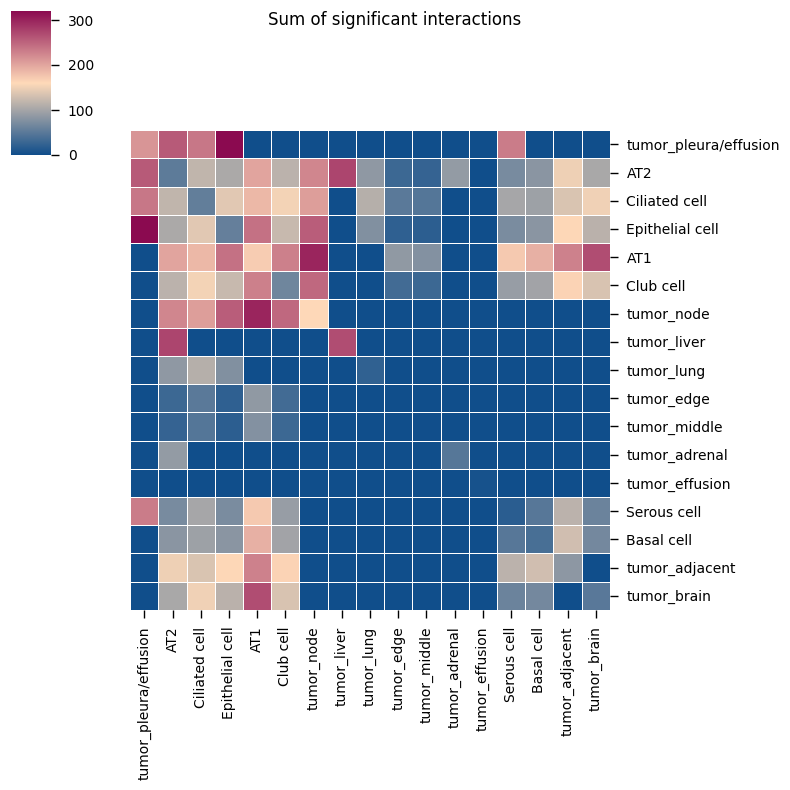

In [29]:

kpy.plot_cpdb_heatmap(pvals = cpdb_results['relevant_interactions'],
                      degs_analysis=True,
                      figsize=(8, 8),
                      title="Sum of significant interactions")

In [52]:
sub_adata.obs['Epithelium_type'].value_counts()

Epithelium_type
Tumor              1319
AT2                 300
Ciliated cell        95
Club cell            58
AT1                  19
Epithelial cell       1
Name: count, dtype: int64

In [ ]:
# 获取所有的SubTissue类别
subtissue_categories = ['normal_adjacent', 'tumor_edge', 'tumor_middle',
'tumor_primary']

# 设置基础路径
base_path = "/home/data/sdzl14/NSCLC/zong/epi"
# 遍历每个SubTissue类别
for subtissue in subtissue_categories:
    # 创建文件夹
    folder_path = os.path.join(base_path, subtissue)
    os.makedirs(folder_path, exist_ok=True)
    
    # 过滤adata以获取特定的SubTissue
    sub_adata = epi[epi.obs['SubTissue'] == subtissue].copy()
    
    # 恢复原始counts到X
    sub_adata.X = sub_adata.layers['counts'].copy()
    
    # 检查基因标识符类型（假设使用基因符号）
    print(f"\nHead of {subtissue}:\n", sub_adata.obs.head(3))
    
    # 保存为h5ad文件
    counts_path = os.path.join(folder_path, "adata.h5ad")
    sub_adata.write(counts_path)
    
    # 创建元数据文件
    df_meta = pd.DataFrame(data={'Cell': list(sub_adata.obs.index), 'cell_type': [i for i in sub_adata.obs['Epithelium_type']]})
    df_meta.set_index('Cell', inplace=True)
    meta_path = os.path.join(folder_path, "meta.tsv")
    df_meta.to_csv(meta_path, sep='\t')
    
    # 设置对比分组依据
    groupby_column = 'Epithelium_type'
    
    # 计算每个分组的样本数量
    group_sizes = sub_adata.obs[groupby_column].value_counts()
    
    # 过滤掉样本数量小于2的分组
    valid_groups = group_sizes[group_sizes >= 2].index.tolist()
    
    if len(valid_groups) < 2:
        print(f"Not enough groups to perform differential expression analysis for {subtissue}. Skipping.")
        continue
    
    # 执行差异分析
    sc.pp.normalize_total(sub_adata, target_sum=1e4)
    sc.pp.log1p(sub_adata)
    sc.pp.highly_variable_genes(
        sub_adata,
        flavor="seurat",
        n_top_genes=2000,
        inplace=True,
        batch_key="Dataset"
    )
    sc.pp.scale(sub_adata, max_value=10)
    
    sc.tl.rank_genes_groups(
        sub_adata,
        groupby=groupby_column,
        groups=valid_groups,
        method='wilcoxon',
        key_added='degs',
        use_raw=False
    )
    
    # 定义显著性阈值
    pval_cutoff = 0.05
    log2fc_cutoff = 0.5
    
    # 获取所有分组名称
    groups = sub_adata.uns['degs']['names'].dtype.names
    
    # 创建DEGs字典
    degs_dict = {}
    for group in groups:
        # 提取当前组的DEG结果
        df = sc.get.rank_genes_groups_df(sub_adata, group=group, key='degs', pval_cutoff=pval_cutoff, log2fc_min=log2fc_cutoff)
        
        # 过滤显著基因
        df_sig = df[(df['pvals_adj'] < pval_cutoff) & (df['logfoldchanges'].abs() > log2fc_cutoff)]
        
        degs_dict[group] = df_sig['names'].tolist()
    
    # 创建两列数据
    degs_list = []
    for cell_type, genes in degs_dict.items():
        for gene in genes:
            degs_list.append([cell_type, gene])
    
    # 转换为DataFrame
    degs_df = pd.DataFrame(degs_list, columns=['cell_type', 'gene_id'])
    
    # 检查基因ID类型（必须为人类基因）
    print(f"\nSignificant DEGs for {subtissue}:\n", degs_df.head())
    
    # 输出示例：
    # cell_type gene_id
    # 0 Stromal_Cell COL1A1
    # 1 Stromal_Cell VWF
    # 2 Macrophage CD68
    
    # 保存为txt文件
    degs_path = os.path.join(folder_path, "degs.txt")
    degs_df.to_csv(degs_path, sep='\t', index=False, header=False)


In [ ]:
degs_df

In [59]:
from cellphonedb.src.core.methods import cpdb_degs_analysis_method
# 参数设置
cpdb_file_path_tumor_primary = "/home/data/sdzl14/NSCLC/zong/spatial/db/test/v5.0.0/cellphonedb.zip"  # 从官网下载的数据库
meta_file_path_tumor_primary = "/home/data/sdzl14/NSCLC/zong/epi/tumor_primary/meta.tsv"
counts_file_path_tumor_primary = "/home/data/sdzl14/NSCLC/zong/epi/tumor_primary/adata.h5ad"
degs_file_path_tumor_primary = "/home/data/sdzl14/NSCLC/zong/epi/tumor_primary/degs.txt"
output_path_tumor_primary = "/home/data/sdzl14/NSCLC/zong/epi/tumor_primary/"
out_path_tumor_primary = "/home/data/sdzl14/NSCLC/zong/epi/tumor_primary/"


cpdb_results_normal_adjacent = cpdb_degs_analysis_method.call(
    cpdb_file_path = cpdb_file_path_tumor_primary,                            # mandatory: CellphoneDB database zip file.
    meta_file_path = meta_file_path_tumor_primary,                            # mandatory: tsv file defining barcodes to cell label.
    counts_file_path = counts_file_path_tumor_primary,                        # mandatory: normalized count matrix - a path to the counts file, or an in-memory AnnData object
    degs_file_path = degs_file_path_tumor_primary,                            # mandatory: tsv file with DEG to account.
    counts_data = 'hgnc_symbol',                                # defines the gene annotation in counts matrix.              # optional (default: None): defines cells per microenvironment.
    score_interactions = True,                                  # optional: whether to score interactions or not. 
    threshold = 0.1,                                            # defines the min % of cells expressing a gene for this to be employed in the analysis.
    result_precision = 3,                                       # Sets the rounding for the mean values in significan_means.
    separator = '|',                                            # Sets the string to employ to separate cells in the results dataframes "cellA|CellB".
    debug = False,                                              # Saves all intermediate tables emplyed during the analysis in pkl format.
    output_path = out_path_tumor_primary,                                     # Path to save results
    output_suffix = None,                                       # Replaces the timestamp in the output files by a user defined string in the  (default: None)
    threads = 25
    )

[ ][CORE][08/05/25-23:20:01][INFO] [Cluster DEGs Analysis] Threshold:0.1 Precision:3
Reading user files...
The following user files were loaded successfully:
/home/data/sdzl14/NSCLC/zong/epi/tumor_primary/adata.h5ad
/home/data/sdzl14/NSCLC/zong/epi/tumor_primary/meta.tsv
/home/data/sdzl14/NSCLC/zong/epi/tumor_primary/degs.txt
[ ][CORE][08/05/25-23:20:16][INFO] Running Real Analysis
[ ][CORE][08/05/25-23:20:16][INFO] Running DEGs-based Analysis
[ ][CORE][08/05/25-23:20:16][INFO] Building results
[ ][CORE][08/05/25-23:20:16][INFO] Scoring interactions: Filtering genes per cell type..


100%|██████████| 8/8 [00:01<00:00,  5.86it/s]

[ ][CORE][08/05/25-23:20:18][INFO] Scoring interactions: Calculating mean expression of each gene per group/cell type..



100%|██████████| 8/8 [00:00<00:00, 21.07it/s]


[ ][CORE][08/05/25-23:20:19][INFO] Scoring interactions: Calculating scores for all interactions and cell types..


100%|██████████| 64/64 [00:02<00:00, 24.84it/s]


Saved deconvoluted to /home/data/sdzl14/NSCLC/zong/epi/tumor_primary/degs_analysis_deconvoluted_05_08_2025_232033.txt
Saved deconvoluted_percents to /home/data/sdzl14/NSCLC/zong/epi/tumor_primary/degs_analysis_deconvoluted_percents_05_08_2025_232033.txt
Saved means to /home/data/sdzl14/NSCLC/zong/epi/tumor_primary/degs_analysis_means_05_08_2025_232033.txt
Saved significant_means to /home/data/sdzl14/NSCLC/zong/epi/tumor_primary/degs_analysis_significant_means_05_08_2025_232033.txt
Saved interaction_scores to /home/data/sdzl14/NSCLC/zong/epi/tumor_primary/degs_analysis_interaction_scores_05_08_2025_232033.txt


In [61]:
cpdb_results_normal_adjacent['relevant_interactions']

,id_cp_interaction,interacting_pair,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,is_integrin,directionality,classification


In [60]:

kpy.plot_cpdb_heatmap(pvals = cpdb_results_normal_adjacent['relevant_interactions'],
                      degs_analysis=True,
                      figsize=(4,4),
                      title="Sum of significant interactions in tumor_primary cells")

ValueError: Length mismatch: Expected axis has 1 elements, new values have 3 elements

In [55]:
from cellphonedb.src.core.methods import cpdb_degs_analysis_method
# 参数设置
cpdb_file_path_normal_adjacent = "/home/data/sdzl14/NSCLC/zong/spatial/db/test/v5.0.0/cellphonedb.zip"  # 从官网下载的数据库
meta_file_path_normal_adjacent = "/home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/meta.tsv"
counts_file_path_normal_adjacent = "/home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/adata.h5ad"
degs_file_path_normal_adjacent = "/home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/degs.txt"
output_path_normal_adjacent = "/home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/"
out_path_normal_adjacent = "/home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/"


cpdb_results_normal_adjacent = cpdb_degs_analysis_method.call(
    cpdb_file_path = cpdb_file_path_normal_adjacent,                            # mandatory: CellphoneDB database zip file.
    meta_file_path = meta_file_path_normal_adjacent,                            # mandatory: tsv file defining barcodes to cell label.
    counts_file_path = counts_file_path_normal_adjacent,                        # mandatory: normalized count matrix - a path to the counts file, or an in-memory AnnData object
    degs_file_path = degs_file_path_normal_adjacent,                            # mandatory: tsv file with DEG to account.
    counts_data = 'hgnc_symbol',                                # defines the gene annotation in counts matrix.              # optional (default: None): defines cells per microenvironment.
    score_interactions = True,                                  # optional: whether to score interactions or not. 
    threshold = 0.1,                                            # defines the min % of cells expressing a gene for this to be employed in the analysis.
    result_precision = 3,                                       # Sets the rounding for the mean values in significan_means.
    separator = '|',                                            # Sets the string to employ to separate cells in the results dataframes "cellA|CellB".
    debug = False,                                              # Saves all intermediate tables emplyed during the analysis in pkl format.
    output_path = out_path_normal_adjacent,                                     # Path to save results
    output_suffix = None,                                       # Replaces the timestamp in the output files by a user defined string in the  (default: None)
    threads = 25
    )

[ ][CORE][08/05/25-23:16:20][INFO] [Cluster DEGs Analysis] Threshold:0.1 Precision:3
Reading user files...
The following user files were loaded successfully:
/home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/adata.h5ad
/home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/meta.tsv
/home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/degs.txt
[ ][CORE][08/05/25-23:16:22][INFO] Running Real Analysis
[ ][CORE][08/05/25-23:16:22][INFO] Running DEGs-based Analysis
[ ][CORE][08/05/25-23:16:22][INFO] Building results
[ ][CORE][08/05/25-23:16:22][INFO] Scoring interactions: Filtering genes per cell type..


100%|██████████| 8/8 [00:00<00:00, 41.54it/s]

[ ][CORE][08/05/25-23:16:23][INFO] Scoring interactions: Calculating mean expression of each gene per group/cell type..



100%|██████████| 8/8 [00:00<00:00, 145.85it/s]


[ ][CORE][08/05/25-23:16:23][INFO] Scoring interactions: Calculating scores for all interactions and cell types..


100%|██████████| 64/64 [00:02<00:00, 22.41it/s]


Saved deconvoluted to /home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/degs_analysis_deconvoluted_05_08_2025_231638.txt
Saved deconvoluted_percents to /home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/degs_analysis_deconvoluted_percents_05_08_2025_231638.txt
Saved means to /home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/degs_analysis_means_05_08_2025_231638.txt
Saved relevant_interactions to /home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/degs_analysis_relevant_interactions_05_08_2025_231638.txt
Saved significant_means to /home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/degs_analysis_significant_means_05_08_2025_231638.txt
Saved interaction_scores to /home/data/sdzl14/NSCLC/zong/epi/normal_adjacent/degs_analysis_interaction_scores_05_08_2025_231638.txt


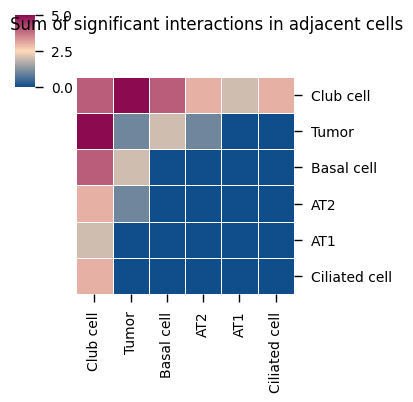

In [58]:

kpy.plot_cpdb_heatmap(pvals = cpdb_results_normal_adjacent['relevant_interactions'],
                      degs_analysis=True,
                      figsize=(4,4),
                      title="Sum of significant interactions in adjacent cells")